In [19]:
import pandas as pd
import matplotlib.pyplot as plt

eq_data = pd.read_csv('https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv')

eq_data

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2025-01-30T11:44:13.686Z,62.432800,-148.25840,25.3000,1.60,ml,NaN,NaN,NaN,0.51,...,2025-01-30T11:46:21.448Z,"71 km N of Chickaloon, Alaska",earthquake,NaN,0.300000,NaN,NaN,automatic,ak,ak
1,2025-01-30T11:30:11.977Z,65.085500,-149.37980,0.0000,1.40,ml,NaN,NaN,NaN,0.72,...,2025-01-30T11:32:39.562Z,"7 km S of Minto, Alaska",earthquake,NaN,0.400000,NaN,NaN,automatic,ak,ak
2,2025-01-30T11:28:46.452Z,60.986100,-151.34310,65.1000,1.70,ml,NaN,NaN,NaN,0.35,...,2025-01-30T11:30:30.702Z,"14 km SW of Tyonek, Alaska",earthquake,NaN,0.700000,NaN,NaN,automatic,ak,ak
3,2025-01-30T11:12:15.490Z,38.823334,-122.84417,2.2700,1.09,md,20.0,76.0,0.007143,0.02,...,2025-01-30T11:13:53.759Z,"9 km NW of The Geysers, CA",earthquake,0.240000,0.410000,0.160,20.0,automatic,nc,nc
4,2025-01-30T10:50:28.198Z,32.277000,-101.30000,3.1431,1.40,ml,18.0,107.0,0.100000,0.30,...,2025-01-30T11:00:51.525Z,"2 km SSE of Coahoma, Texas",earthquake,0.000000,1.468824,0.200,11.0,automatic,tx,tx
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8931,2024-12-31T12:05:49.162Z,32.466000,-101.17100,5.8105,1.00,ml,23.0,64.0,0.000000,0.10,...,2025-01-02T11:27:08.977Z,"19 km NW of Westbrook, Texas",earthquake,0.693735,0.777679,0.200,19.0,reviewed,tx,tx
8932,2024-12-31T12:04:51.497Z,9.158200,40.08090,10.0000,4.20,mb,37.0,118.0,1.408000,0.34,...,2025-01-23T19:24:51.040Z,"21 km NNW of Āwash, Ethiopia",earthquake,6.000000,1.881000,0.105,25.0,reviewed,us,us
8933,2024-12-31T12:04:00.736Z,18.673300,145.47940,206.8780,3.70,mb,19.0,148.0,3.426000,0.56,...,2025-01-23T19:53:11.040Z,"Pagan region, Northern Mariana Islands",earthquake,12.840000,10.833000,0.146,12.0,reviewed,us,us
8934,2024-12-31T11:57:33.411Z,31.728000,-104.25700,7.7917,1.60,ml,19.0,50.0,0.000000,0.20,...,2024-12-31T13:45:01.495Z,"50 km SSE of Whites City, New Mexico",earthquake,0.900844,0.813887,0.200,15.0,reviewed,tx,tx


In [4]:
eq_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8938 entries, 0 to 8937
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             8938 non-null   object 
 1   latitude         8938 non-null   float64
 2   longitude        8938 non-null   float64
 3   depth            8938 non-null   float64
 4   mag              8938 non-null   float64
 5   magType          8938 non-null   object 
 6   nst              7769 non-null   float64
 7   gap              7769 non-null   float64
 8   dmin             7768 non-null   float64
 9   rms              8937 non-null   float64
 10  net              8938 non-null   object 
 11  id               8938 non-null   object 
 12  updated          8938 non-null   object 
 13  place            8938 non-null   object 
 14  type             8938 non-null   object 
 15  horizontalError  7097 non-null   float64
 16  depthError       8938 non-null   float64
 17  magError      

In [5]:
eq_data.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,8938.000000,8938.000000,8938.000000,8938.000000,7769.000000,7769.000000,7768.000000,8937.000000,7097.000000,8938.000000,7752.000000,7767.000000
mean,38.959940,-104.651565,19.426664,1.576817,23.792123,112.823539,0.501344,0.262543,1.900863,2.231552,0.183944,18.502253
std,18.426818,71.396157,52.873911,1.358270,22.624621,63.409269,1.710676,0.283733,3.491980,4.986672,0.113134,24.409492
min,-65.296600,-179.980400,-3.490000,-1.890000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,33.514208,-147.153075,2.262500,0.750000,9.000000,66.000000,0.014417,0.076600,0.260000,0.480000,0.112866,7.000000
50%,38.813000,-121.670000,6.868900,1.300000,17.000000,96.000000,0.059505,0.160000,0.430000,0.820000,0.169519,12.000000
75%,51.679525,-113.000750,11.800000,2.000000,29.000000,144.720000,0.136825,0.330000,1.050000,1.868750,0.227000,22.000000
max,82.479300,179.948800,644.832000,7.100000,315.000000,348.000000,30.223000,3.630000,64.520703,111.200000,2.970000,703.000000


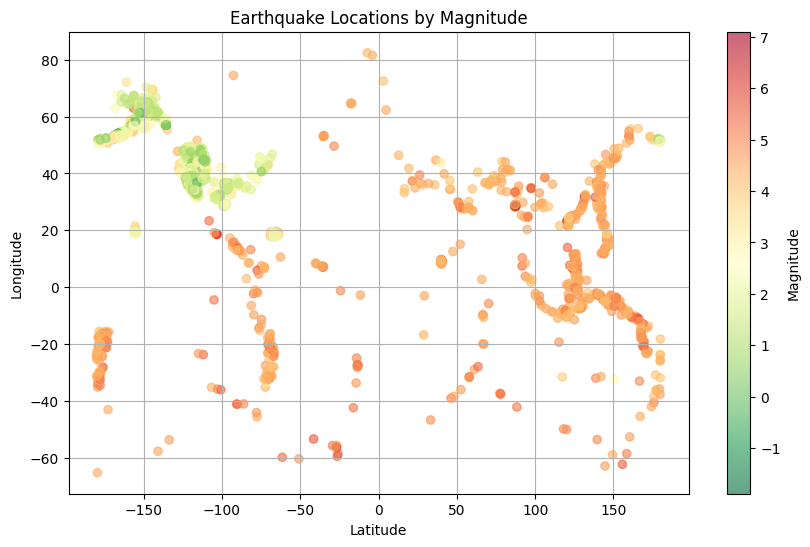

In [6]:
# Earthquakes by Location  

plt.figure(figsize=(10, 6))

# Create the scatter plot
scatter = plt.scatter(eq_data['longitude'], eq_data['latitude'], # Swapped axes
                     c=eq_data['mag'],  # Color by magnitude
                     cmap='RdYlGn_r',   # Reversed colormap for green=low, red=high
                     alpha=0.6)        # Set transparency

# Add the color bar
plt.colorbar(scatter, label='Magnitude')

# Correctly label the swapped axes
plt.xlabel('Latitude')
plt.ylabel('Longitude')

# Add title and grid
plt.title('Earthquake Locations by Magnitude')
plt.grid(True)

# Show the plot
plt.show()


In [25]:
# Seems like we have a the colours the wrong way round , I need to reverse the colour map!

import folium
import branca.colormap as cm

# Define a reversed colormap manually (Green for weakest, Red for strongest)
colormap = cm.linear.RdYlGn_11.scale(eq_data['mag'].min(), eq_data['mag'].max())
colormap.colors = colormap.colors[::-1]  # Reverse the color order manually

# Create a base map centered on the USA
map_usa = folium.Map(location=[39.8283, -98.5795], zoom_start=4)

# Add points for each earthquake with smooth color transition
for idx, row in eq_data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['mag'] * 1.5,  # Adjust marker size based on magnitude
        color=colormap(row['mag']),  # Apply manually reversed gradient color
        fill=True,
        fill_color=colormap(row['mag']),
        fill_opacity=0.7,
        popup=f"Magnitude: {row['mag']}\nLat: {row['latitude']}, Long: {row['longitude']}"
    ).add_to(map_usa)

# Add the color legend to the map
colormap.caption = "Earthquake Magnitude"
map_usa.add_child(colormap)

# Display the map
map_usa


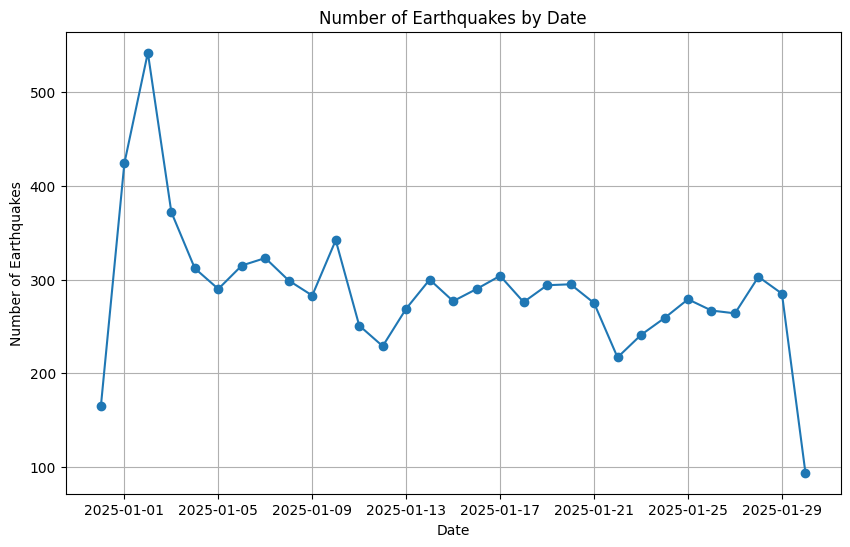

In [26]:
# Convert the 'date' column to pandas datetime
eq_data['time'] = pd.to_datetime(eq_data['time'])

# Group by date and count occurrences
earthquakes_by_date = eq_data.groupby(eq_data['time'].dt.date).size()

# Plot the line chart
plt.figure(figsize=(10, 6))
earthquakes_by_date.plot(kind='line', marker='o')
plt.title('Number of Earthquakes by Date')
plt.xlabel('Date')
plt.ylabel('Number of Earthquakes')
plt.grid(True)
plt.show()